<a href="https://colab.research.google.com/github/frank690/math4ai/blob/main/assignment_07_DCGAN_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

HHU Deep Learning in Life Science: Generative Models, Prof. Dr. Markus Kollmann, SS2022
## Assignment 7 - Conditional Generative Adversarial Network (GAN)

This exercise was created by *Nikolaos Adaloglou* and *Tim Kaiser* for `Deep Learning in Life Science: Generative Models` in 2022

---

This exercise is about implementing and understanding the [DCGAN](https://arxiv.org/abs/1511.06434v2) model. We will also try to incorporate the label information.

### Table of Contents

The notebook contains of the following sections:

1. Preparation and Data Setup
2. c-DCGAN Architectures
3. Conditioning under Labels
4. Evaluation
5. Questions

Let's start by basic imports and defining the dataset.

In [7]:
import os
import torch
import torch.optim as optim
import torchvision
import torch.nn as nn
from torchvision import transforms
import torchvision.datasets as datasets
import torch.utils.data as data
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import torch.nn.functional as F
import pylab
import numpy as np

device = "cuda"

# Part I. Preparation and Data Setup

Load the cifar10 dataset from `torchvision`. Convert the labels to one-hot encodings and resize the images to 64x64. The reason for the resizing is that the DCGAN model produces 64x64 images. Normalize the images with the imagenet statistics:

```
means = (0.485, 0.456, 0.406)
vars = (0.229, 0.224, 0.225)
```

Remember: The output of the generator should be in the same range! You will need a specific activation function for this purpose.

In [11]:
def cifar_10_one_hot_encode(y):
    return torch.eye(10)[y]
    
def get_data_loader(batch_size):
    means = (0.485, 0.456, 0.406)
    var = (0.229, 0.224, 0.225)

    transform = transforms.Compose([transforms.ToTensor(),
                                   transforms.Normalize(means, var),
                                   transforms.Resize(64)])

    train_set = torchvision.datasets.CIFAR10(root='data',
                                       train=True,
                                       transform=transform,
                                       target_transform=cifar_10_one_hot_encode,
                                       download=True)

    dataloader = torch.utils.data.DataLoader(
        dataset=train_set,
        batch_size=batch_size, 
        shuffle=True,
        drop_last = True
    )
    return dataloader

# Part II. c-DCGAN Architectures

Implement the following architectures for G and D based on the parameters:

```
label_size: latent size of the labels
z_size: latent size of the random noise vector
total_size = label_size + z_size
act is the activation function in the print statement below. think about which one to use
```

The Generator architecture should have a boolean parameter that controls whether there is a condition (label one hot vector or not).

In general it's a good idea to make the implementation modular. In this case for example both models have `base_channels = 64` and go up to `base_channels*8= 512`. This will make it able for you to scale up and down G and D with a single parameter. It is totally optional though.

**The mlp module and the concatenation of the output of the mlp should be used only when we have the condition.**

```
Generator(
  # The mlp module should be used only when we have the condition.
  (mlp): Sequential(
    (0): Linear(in_features=10, out_features=label_size, bias=True)
    (1): ReLU(inplace=True)
  )
  (main): Sequential(
    (0): ConvTranspose2d(total_size, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): act()
  )
)


Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  )
)
```

In [12]:
# Implement your models here
# Optional to use:
class Generator(nn.Module):
    def __init__(self, out_channels=3, z_size=100, g_base_channels=64, condition=True,
                        num_labels=10, label_latent_dim=128):
        """
        out_channels: image channels to generate
        z_size: noise vector size
        g_base_channels: input channels of G of the last transp. Conv layer.
                          Controls network complexity
        condition: whether to include labels
        """
        super(Generator, self).__init__()
        self.condition = condition
        
        total_size = z_size
        
        if condition:
            total_size += label_latent_dim
            
        self.mlp = nn.Sequential(
                nn.Linear(in_features=num_labels, out_features=label_latent_dim, bias=True),
                nn.ReLU(inplace=True)
            )
        
        self.main = nn.Sequential(
            nn.ConvTranspose2d(total_size, g_base_channels*8, kernel_size=(4, 4), stride=(1, 1), bias=False),
            nn.BatchNorm2d(g_base_channels*8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(g_base_channels*8, g_base_channels*4, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(g_base_channels*4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(g_base_channels*4, g_base_channels*2, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(g_base_channels*2, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(g_base_channels*2, g_base_channels, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(g_base_channels, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(g_base_channels, out_channels, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)                    
        )

    def act(self, z):
        return torch.tanh(z)
        
    def forward(self, z, label=None):
        if label is not None and self.condition is True:
            y = self.mlp(label)
            y = y[:, :, None, None]
            z = torch.cat((z,y), axis = 1)
        z = self.main(z)
        return self.act(z)

# Optional to use:
class Discriminator(nn.Module):
    def __init__(self, d_base_channels=64, out_channels=3):
        super(Discriminator, self).__init__()

        self.main = nn.Sequential(
            nn.Conv2d(out_channels, d_base_channels, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
            nn.Conv2d(d_base_channels, 2*d_base_channels, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(2*d_base_channels, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
            nn.Conv2d(2*d_base_channels, 4*d_base_channels, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(4*d_base_channels, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
            nn.Conv2d(4*d_base_channels, 8*d_base_channels, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(8*d_base_channels, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
            nn.Conv2d(8*d_base_channels, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
        )
        
    def forward(self, x):
        return self.main(x)

# Your generator may look like this:
G = Generator(z_size=100, g_base_channels=64, condition=True,
                        num_labels=10, label_latent_dim=128)
D = Discriminator(d_base_channels=64)

# You can cross check you generator by initializing it 
# and performing a forward like:

z = torch.rand(2,100,1,1)
label = torch.rand(2,10)
img = G(z,label)
assert list(img.shape) == [2, 3, 64, 64]

G = Generator(z_size=100, g_base_channels=64, condition=False)
img = G(z) # or even G(z, None)
assert list(img.shape) == [2, 3, 64, 64]
out = D(img)

# Part III. Conditioning under Labels

- Implement the `train_generator` function.

In [13]:
def gen_one_hot(n, label_id=None):
    """
    the function returns a batch of labels as
    one hot-vectors for the condtional image generation
    if label_id is specified i.e. 7 it generates
    a batch of 7's one hot vectors otherwise it
    randomly samples diffent image classes.
    """
    # generate a specific label i.e. 7's
    if label_id is not None:
        if type(label_id) == int:
            label_ids = torch.tensor([label_id]*n)
    # generate a batch of n random labels
    else:
        label_ids = torch.randint(low=0, high=10, size=(n,))
  
    with torch.no_grad():
        label_ids = F.one_hot(label_ids, 10).float()
    return label_ids


def sample(n, G, latent_size, label_id=None, condition=True, plot=False, device="cuda"):
    """Function to sample"""
    z = torch.randn(n, latent_size, 1, 1).to(device)
    if condition:
        label_ids = gen_one_hot(n, label_id)
        if label_ids is not None:
            label_ids = label_ids.to(device)
        samples = G(z, label_ids)
    else:
        samples = G(z)
    
    if plot:
        # scale intensities from [-1, 1] --> [0, 1]
        samples = (samples + 1)/2
        plt.figure(figsize=(14,14))
        plt.title("Test Samples")
        plt.imshow(make_image_grid(samples, nrow=4))
        plt.axis("off")
        plt.show()
    return samples

# input: [bs, 3, 32, 32]
def make_image_grid(images, nrow=8):
    """Helper function for plotting later"""
    images = images.float()  
    grid = torchvision.utils.make_grid(images, nrow)
    grid = grid.permute(1, 2, 0).cpu().numpy()  # from CHW to HWC
    return grid

In [23]:
# Implement this one
# if you use these arguments you will not have to mofidy the 'train' function
def train_generator(G, D, g_optimizer, z, criterion, labels=None, device='cuda'):
    """
    G: the generator module
    D: the discriminator module
    g_optimizer: the optimizer of G
    z: the sampled random vector 
    criterion: nn.BCEWithLogitsLoss() in out train code
    labels: the batch of labels of the current image batch
    device: in which device to perform the training
    """
    fake_imgs = G.forward(z, labels)
    pred_fake = D.forward(fake_imgs)
    fake_labels = torch.ones(z.shape[0], 1, 1, 1).to(device)
    loss = criterion(input=pred_fake, target=fake_labels)
    loss.backward()
    g_optimizer.step()
    
    return loss, fake_imgs, pred_fake

# given. same as in previous exercise
def train_discriminator(D, d_optimizer, real_imgs, fake_imgs, criterion, device='cuda'):
    N = real_imgs.size(0)
    # Reset gradients
    d_optimizer.zero_grad()
    
    # Train on Real Data
    pred_real = D(real_imgs)
    # Calculate loss 
    loss_real = criterion(pred_real, torch.ones(N, 1, 1, 1).to(device))

    # Train D on Fake Data, 
    # Remove gradient flows from fake data so that G will not be updated
    pred_fake = D(fake_imgs.detach())
    # Calculate loss
    loss_fake = criterion(pred_fake, torch.zeros(N, 1, 1, 1).to(device))

    # Backpropagate
    loss_D = loss_real + loss_fake
    loss_D.backward()

    # Update weights with gradients
    d_optimizer.step()
    return loss_D, pred_real

def train(epochs, G, D, train_loader, latent_size, label_latent_size,
            g_optimizer, d_optimizer, logs, condition=True, device='cuda'): 
    criterion = nn.BCEWithLogitsLoss()

    save_dir = './'
    steps_G = 1
    for epoch in range(epochs):
        for i, (images, labels) in enumerate(train_loader):
            batch_size = images.shape[0]
            # flatten mnist images + move to gpu
            real_imgs = images.to(device)

            
            labels = labels.to(device) if condition else None

            # ================================================================== #
            #                        Train the generator                         #
            # ================================================================== #
            # Compute loss with fake images
            # Input should be in shape [bs, latent_size, 1, 1]
            z = torch.randn(batch_size, latent_size, 1, 1).to(device)
            g_loss, fake_imgs, pred_fake  = train_generator(G, D, g_optimizer, z, 
                                                            criterion, labels)
            
            # ================================================================== #
            #                      Train the discriminator                       #
            # ================================================================== #
            d_loss, pred_real = train_discriminator(D, d_optimizer, real_imgs, fake_imgs, criterion)

            # =================================================================== #
            #                          Update Statistics                          #
            # =================================================================== #
            d_loss_scalar = d_loss.cpu().item()
            g_loss_scalar = g_loss.cpu().item()
            # add sigmoid for ploting the probabilities
            pred_real = torch.sigmoid(pred_real).mean().cpu().detach()
            pred_fake = torch.sigmoid(pred_fake).mean().cpu().detach()

            logs["d_loss_hist"].append(d_loss_scalar)
            logs["g_loss_hist"].append(g_loss_scalar)

            logs["prob_fake_hist"].append(pred_fake)
            logs["prob_real_hist"].append(pred_real)

           
        print(f"Ep {epoch:02}: Loss_D: {d_loss_scalar:.3f}. Loss_G: {g_loss_scalar:.3f}. D(x): {pred_real:.3f}. D(G(z)): {pred_fake:.3f}.")
            
        # Plot samples
        freq_sample = 1
        if epoch % freq_sample == 0:
            # Generate random batch of images
            sample(16, G, latent_size, condition=condition, plot=True, device=device)

        # Save model at checkpoints
        if (epoch+1) % 50 == 0:
            torch.save(G.state_dict(), os.path.join(save_dir, f'G_ep{epoch}.ckpt'))
            torch.save(D.state_dict(), os.path.join(save_dir, f'D_ep{epoch}.ckpt'))


    # Save the model checkpoints 
    torch.save(G.state_dict(), 'G_last.ckpt')
    torch.save(D.state_dict(), 'D_last.ckpt')
    return logs

# Training code: Putting everything together

Train both models DCGAN and conditional DCGAN for at least 50 epochs. You will very likely observe training instabilities, like collapse of either G or D or circular loss behaviour. You can improve training stability by adjusting the balance between G and D. Ways to do this include:

* Adjust the learning rates individually
* Adjust the size of the networks relative to each other
* Adjust the size of the latent space

Observe the evolution of losses and sample quality during training in order to identify training instabilities.

In [24]:
z_size = 100
batch_size = 64
label_latent_dim = 128

epochs = 10
logs = {"d_loss_hist": [],
        "g_loss_hist": [],
        "prob_real_hist": [],
        "prob_fake_hist": []}

# Unconditional DCGAN

Files already downloaded and verified
Ep 00: Loss_D: 0.000. Loss_G: 11.135. D(x): 1.000. D(G(z)): 0.000.


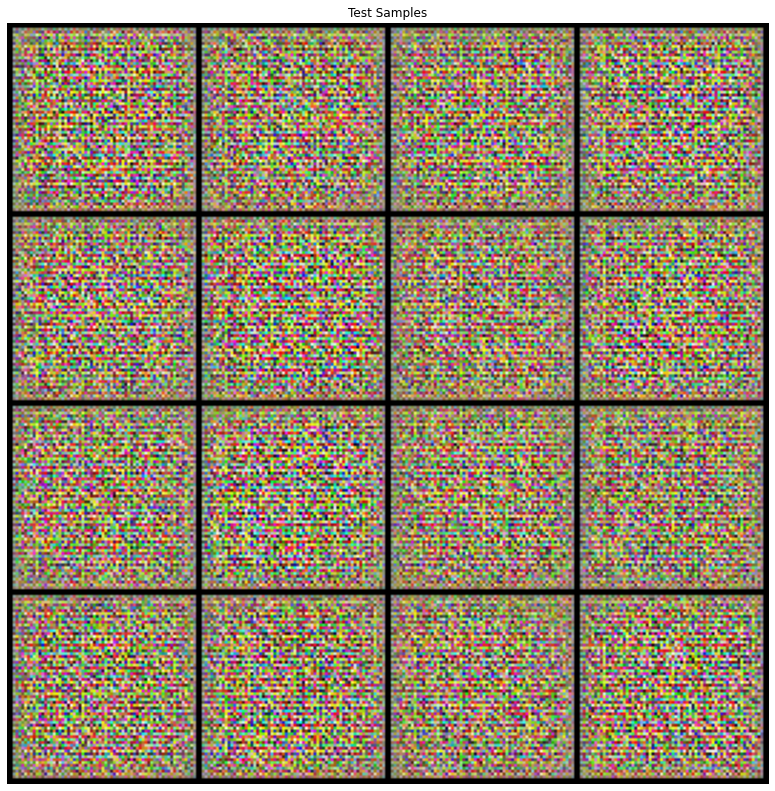

KeyboardInterrupt: ignored

In [26]:
condition = False
G2 = Generator(z_size=z_size, condition=condition, g_base_channels=64,
              label_latent_dim=label_latent_dim).to(device)
D = Discriminator(d_base_channels=64).to(device)

optD = torch.optim.Adam(D.parameters(), lr=1e-4)
optG = torch.optim.Adam(G.parameters(), lr=1e-4)

data_loader = get_data_loader(batch_size=batch_size)

logs2 = train(epochs, G2, D, data_loader, z_size, label_latent_dim,
            optG, optD, logs, condition=condition, device=device)

# Conditional DCGAN

Files already downloaded and verified
Ep 00: Loss_D: 0.000. Loss_G: 10.062. D(x): 1.000. D(G(z)): 0.000.


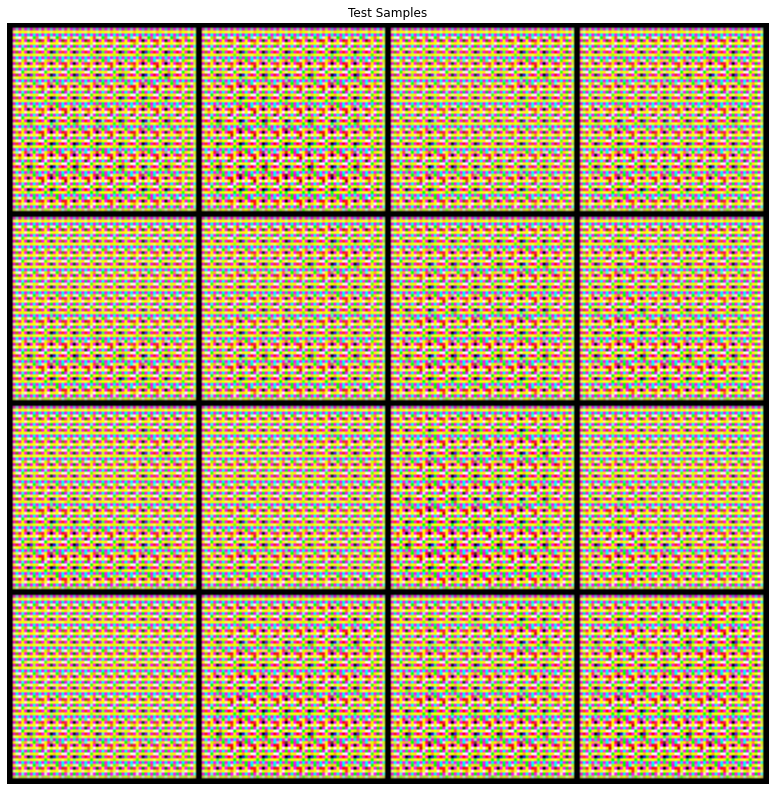

Ep 01: Loss_D: 0.000. Loss_G: 11.690. D(x): 1.000. D(G(z)): 0.000.


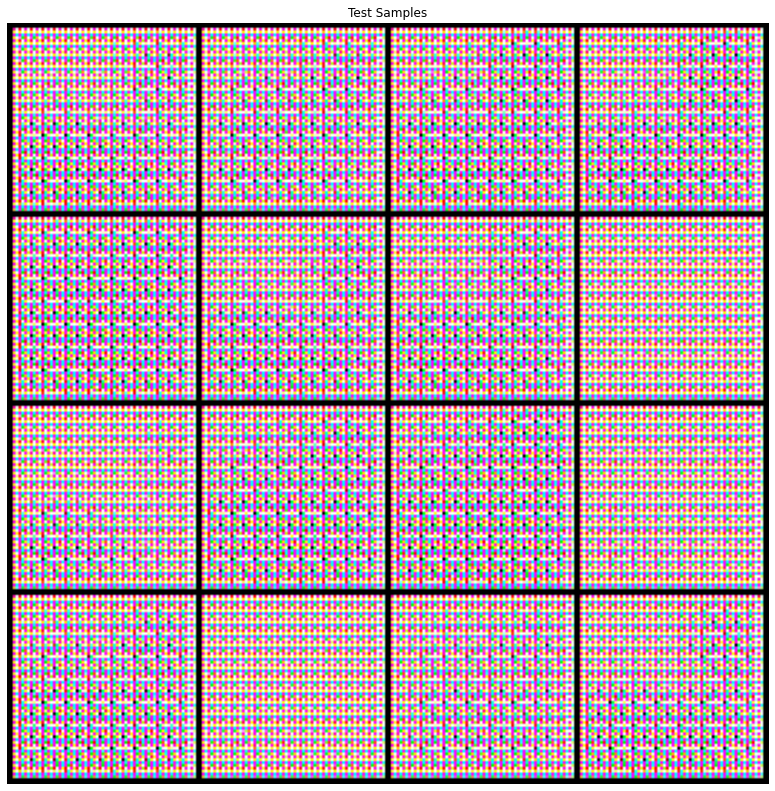

Ep 02: Loss_D: 0.000. Loss_G: 12.522. D(x): 1.000. D(G(z)): 0.000.


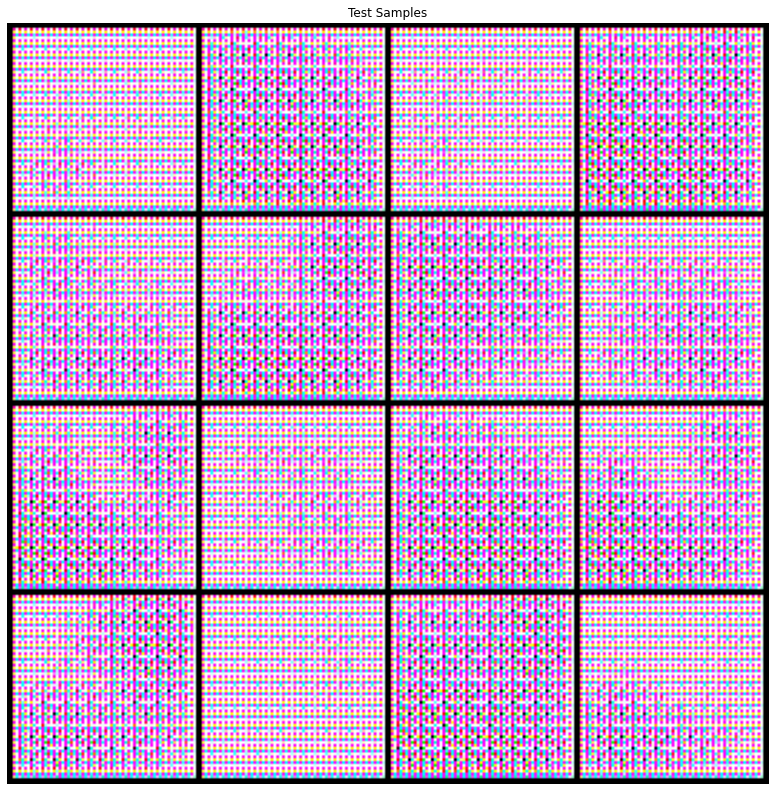

Ep 03: Loss_D: 0.000. Loss_G: 12.845. D(x): 1.000. D(G(z)): 0.000.


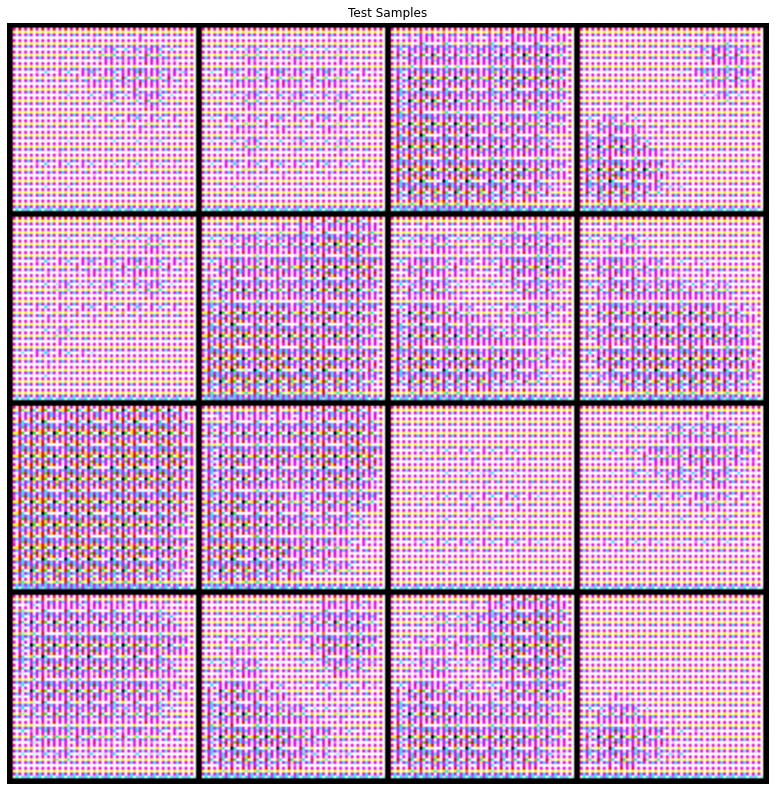

Ep 04: Loss_D: 0.000. Loss_G: 12.577. D(x): 1.000. D(G(z)): 0.000.


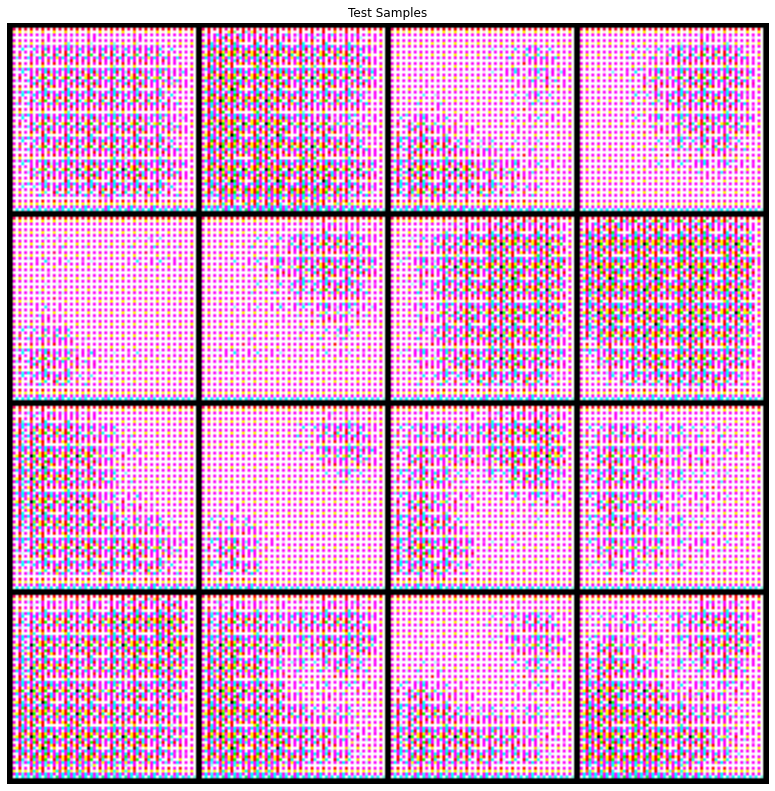

Ep 05: Loss_D: 0.000. Loss_G: 13.020. D(x): 1.000. D(G(z)): 0.000.


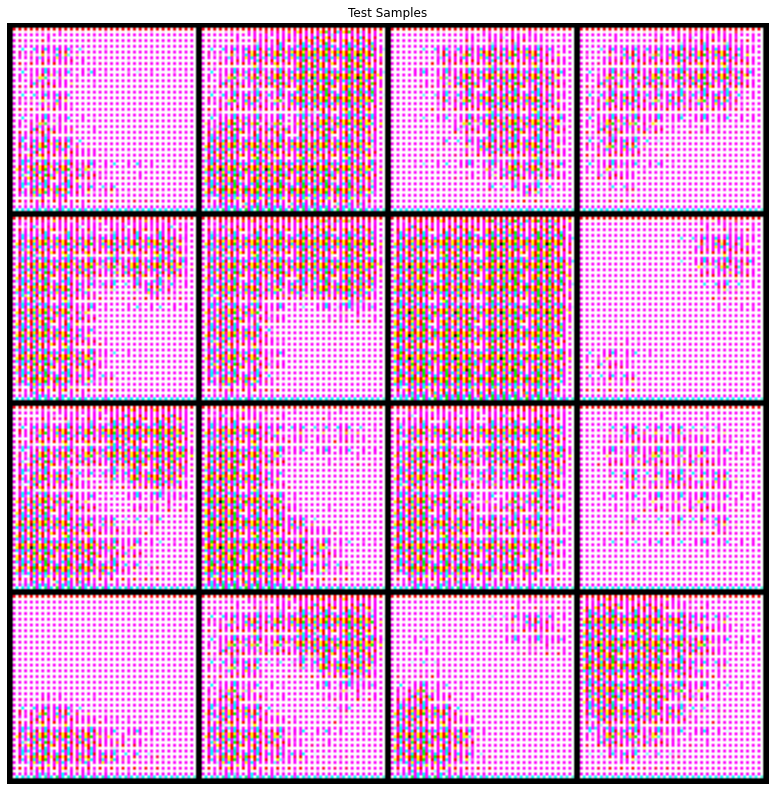

Ep 06: Loss_D: 0.000. Loss_G: 13.519. D(x): 1.000. D(G(z)): 0.000.


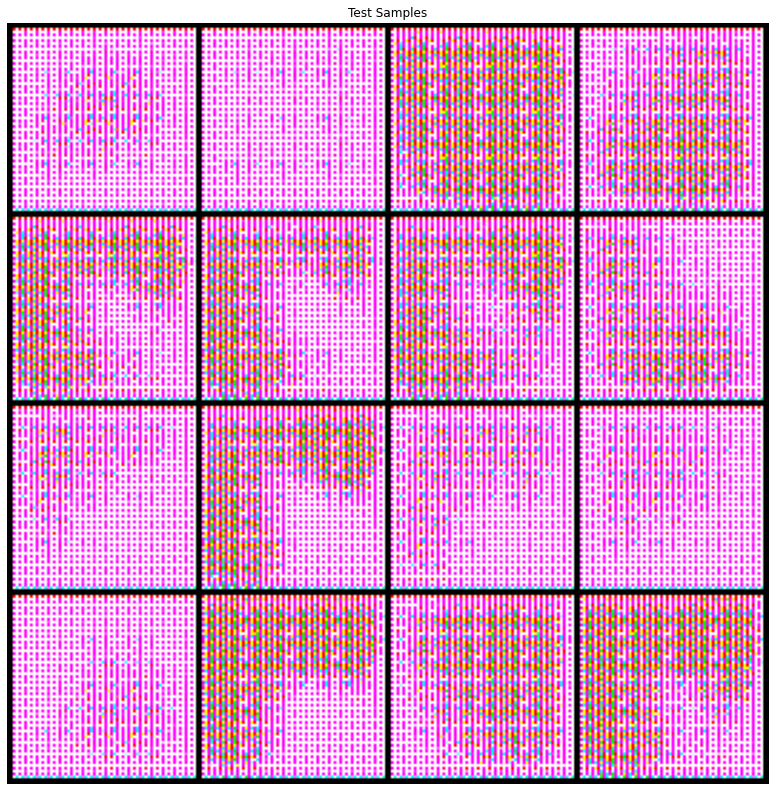

Ep 07: Loss_D: 0.000. Loss_G: 13.524. D(x): 1.000. D(G(z)): 0.000.


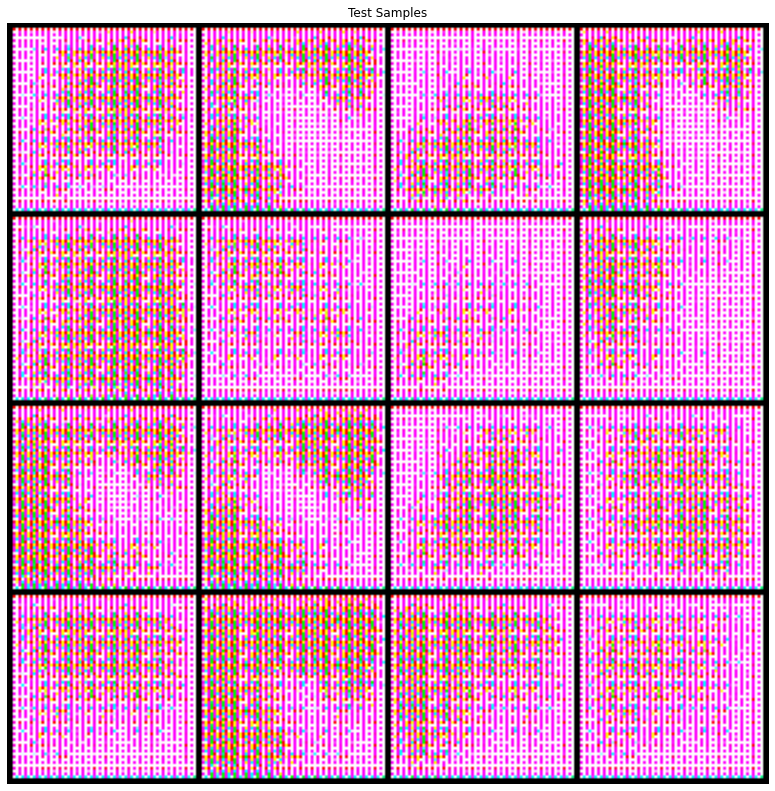

Ep 08: Loss_D: 0.000. Loss_G: 13.914. D(x): 1.000. D(G(z)): 0.000.


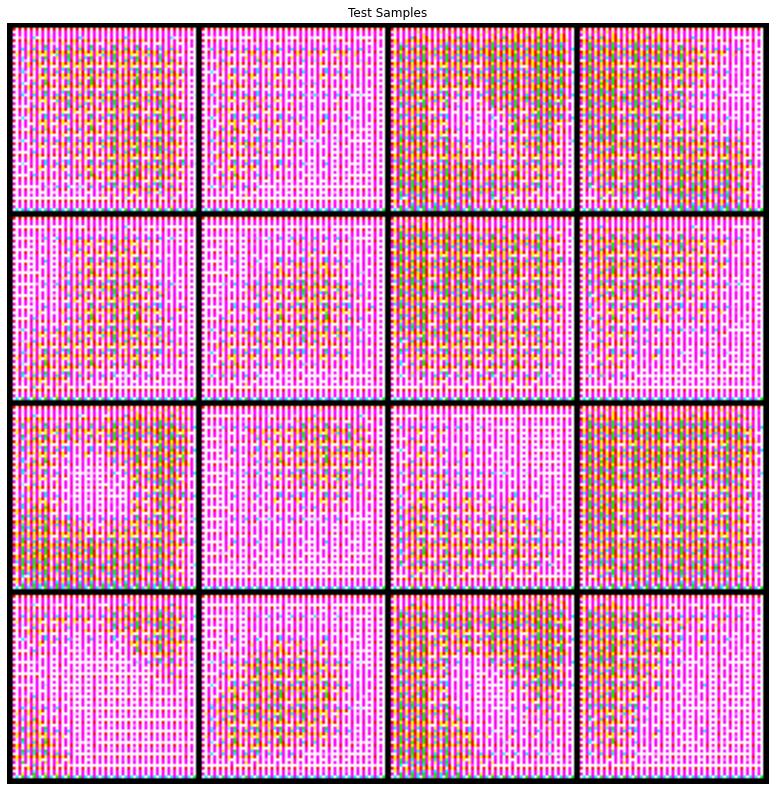

Ep 09: Loss_D: 0.000. Loss_G: 13.989. D(x): 1.000. D(G(z)): 0.000.


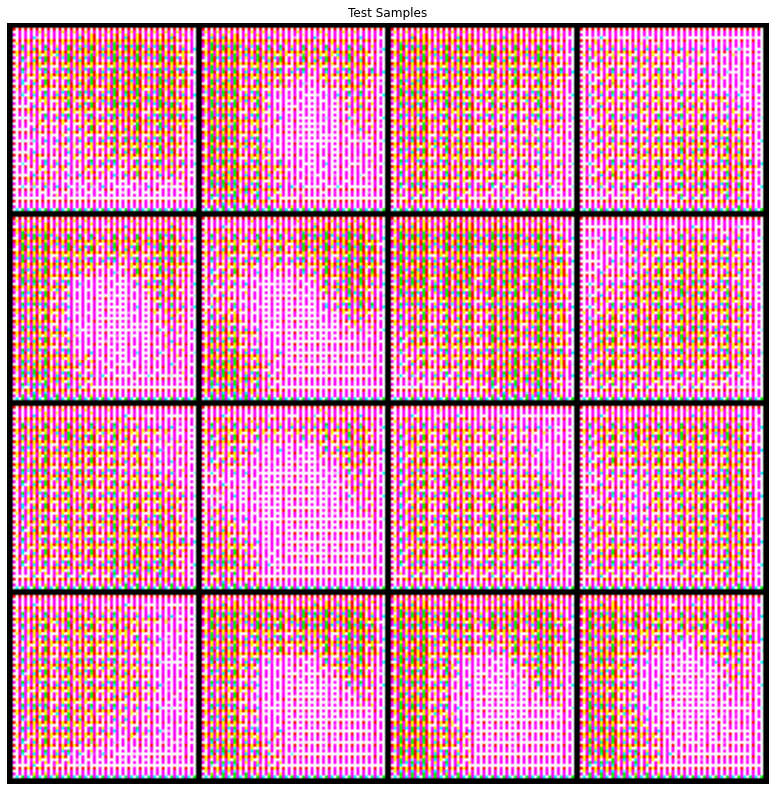

In [27]:
condition = True

G = Generator(z_size=z_size, condition=condition, num_labels=10, g_base_channels=64,
              label_latent_dim=label_latent_dim).to(device)
D = Discriminator(d_base_channels=64).to(device)

logs = {"d_loss_hist": [],
        "g_loss_hist": [],
        "prob_real_hist": [],
        "prob_fake_hist": []}
        
optD = torch.optim.Adam(D.parameters(), lr=1e-4)
optG = torch.optim.Adam(G.parameters(), lr=1e-4)

data_loader = get_data_loader(batch_size=batch_size)

logs = train(epochs, G, D, data_loader, z_size, label_latent_dim,
            optG, optD, logs, condition=condition, device=device)

# Part IV. Evaluation

In [ ]:
def plot_curves(logs):
  plt.figure(figsize=(15,8))
  plt.plot(logs["g_loss_hist"], label='G loss')
  plt.plot(logs["d_loss_hist"], label='D loss')    
  plt.legend()
  plt.show()
  plt.close()

  plt.figure(figsize=(15,8))
  plt.plot(logs["prob_fake_hist"], label='Fake scores D(G(z)) from training D')
  plt.plot(logs["prob_real_hist"], label='Real scores D(x) from training D')
  plt.legend()
  plt.show()
  plt.close()

plot_curves(logs)
plot_curves(logs2)

sample(16, G, z_size, condition=False, plot=True, device=device)
sample(16, G2, z_size, condition=False, plot=True, device=device)

# Part V. Questions

- If you managed to train a decent model, you will probably start to observe the so-called checkboard effect. Which module is responsible for this?

- Ideas for training: https://github.com/soumith/ganhacks. Don't implement everything you read here, it's just for inspiration.


